<a href="https://colab.research.google.com/github/Alex112525/Doom-with-AI/blob/master/Vizdoom.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt-get update
!sudo apt-get install libsdl2-dev --fix-missing
!apt-get install build-essential zlib1g-dev libjpeg-dev \
nasm tar libbz2-dev libgtk2.0-dev cmake git libfluidsynth-dev libgme-dev \
libopenal-dev timidity libwildmidi-dev unzip

In [ ]:
!pip install vizdoom

     |████████████████████████████████| 21.9MB 49.4MB/s 
  Created wheel for vizdoom: filename=vizdoom-1.1.8-cp37-none-any.whl size=14461416 sha256=da13f4ed4fc34b6d5e026d7ae237a6f9a7ba9e2c0194f7788e90a82e3549ec34
  Stored in directory: /root/.cache/pip/wheels/7d/04/dd/fafbaf68bb30e82ca4e336b9e13813d667d81aecb4648227a3
Successfully built vizdoom


In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd '/gdrive/My Drive/vizDoom'

Mounted at /gdrive
/gdrive/My Drive/vizDoom


In [ ]:
#!git clone https://github.com/mwydmuch/ViZDoom.git

In [ ]:
%cd '/gdrive/My Drive/vizDoom/ViZDoom/scenarios'
!ls

/gdrive/My Drive/vizDoom/ViZDoom/scenarios
basic.cfg		    defend_the_line.cfg		  predict_position.cfg
basic.wad		    defend_the_line.wad		  predict_position.wad
bots.cfg		    health_gathering.cfg	  README.md
cig.cfg			    health_gathering_supreme.cfg  rocket_basic.cfg
cig.wad			    health_gathering_supreme.wad  rocket_basic.wad
cig_with_unknown.wad	    health_gathering.wad	  shoot.jpg
deadly_corridor.cfg	    learning.cfg		  simpler_basic.cfg
deadly_corridor.wad	    multi.cfg			  simpler_basic.wad
deathmatch.cfg		    multi_deathmatch.wad	  take_cover.cfg
deathmatch.wad		    multi_duel.cfg		  take_cover.wad
DeepQDoom.cfg		    multi_duel.wad		  _vizdoom
defend_the_center.cfg	    my_way_home.cfg		  _vizdoom.ini
defend_the_center.cfg.gdoc  my_way_home.wad
defend_the_center.wad	    oblige.cfg


In [ ]:
DEFAULT_CONFIG = '/gdrive/My Drive/vizDoom/ViZDoom/scenarios/defend_the_center.cfg'
PATH = '/gdrive/My Drive/vizDoom/ViZDoom/Modelo_15epoch.pth'

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torchvision import models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

In [ ]:
from vizdoom import *
import random
import cv2
import time
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

plt.ion()

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # Comenzamos un una capa convolucional
        # kernel de 5x5
        self.conv1 = nn.Conv2d(3, 8, kernel_size=(5, 5))
        # Otra capa convolucional donde entran los 8 canales
        # Salida de 20 canales
        self.conv2 = nn.Conv2d(8, 20, kernel_size=(5, 5))

        self.fc1 = nn.Linear(77000, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 3)

    def forward(self, x):
        # Max polling de 2*2 y activacion con Relu
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        # cambiamos la forma del tensor x, -1 infiere que es otra dimension
        x = x.view(-1, self.num_flat_features(x))
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)

        x = F.log_softmax(x, dim=1)

        return x

    def num_flat_features(self, x):
        size = x.size()[1:]  # Todas las dimensiones excepto la del batch
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

In [ ]:
game = DoomGame()
game.load_config(DEFAULT_CONFIG)
game.set_window_visible(False)
game.set_screen_format(ScreenFormat.RGB24)
game.set_screen_resolution(ScreenResolution.RES_320X240)
#game.set_mode(Mode.PLAYER)
game.init()

shoot = [0, 0, 1]
left = [1, 0, 0]
right = [0, 1, 0]
actions = [shoot, left, right]

In [ ]:
def print_screen(img):
  plt.figure()
  #print(img.shape)
  obs_h, obs_w, _ = img.shape
  #img = img[0:int(obs_h*0.89), :, :]
  screen = np.ascontiguousarray(img, dtype=np.float32) / 255
  obs = torch.from_numpy(screen)
  plt.imshow(obs.numpy(), interpolation='none')
  plt.show()

#game.new_episode()
#state = game.get_state()
#img = state.screen_buffer
#print_screen(img)

In [ ]:
def save_frame(img, label):
  #print(img.shape)
  obs_h, obs_w, _ = img.shape
  img = img[0:int(obs_h*0.89), :, :]
  cv2.imwrite(f"/gdrive/My Drive/vizDoom/Train/C_{label}.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))#Rows, Cols, Chanels

Crear Dataset

In [ ]:
episodes = 1000
t = 0
for i in range(episodes):
    game.new_episode()
    screenshot = 0
    time_sc = random.randint(15, 30)
    while not game.is_episode_finished():
        state = game.get_state()
        img = state.screen_buffer
        misc = state.game_variables
        #reward = game.make_action(random.choice(actions))
        reward = game.make_action(right)
        #print("\treward:", reward)
        #time.sleep(0.02)
        if time_sc == screenshot:
          save_frame(img, t)
          screenshot = 0
          t += 1
        screenshot += 1
        if t == 1300:
          break
    if t == 1300:
        break
    print("Result:", game.get_total_reward())
    #time.sleep(1)

In [ ]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
    )

trainset = torchvision.datasets.ImageFolder(root='/gdrive/My Drive/vizDoom/Train', 
                                transform=transform)
trainloader = DataLoader(trainset, batch_size=1, shuffle=True)

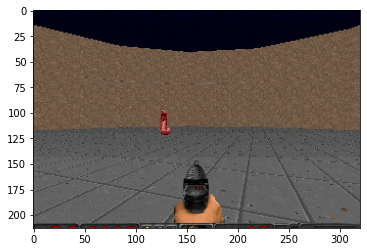

torch.Size([1, 3, 213, 320])
tensor([0])


In [ ]:
def imshow(img):
    img = img / 2 + 0.5     # Unnormalize
    np_img = img.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.show()
    
def test_trainLoader():
    # get some random training images
    data_iter = iter(trainloader)
    images, labels = next(data_iter)

    # Show images
    imshow(torchvision.utils.make_grid(images))
    # print labels
    print(images.shape)
    print(labels)

test_trainLoader()

Entrenamiento

In [ ]:
Loss_plot = []
Epoch_plot = []
def train(epoch=1):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(net.parameters(), lr=0.0005, momentum=0.9)

    for epoch in range(epoch):
        running_loss = 0.0

        for i, data in enumerate(trainloader, 0):
            inputs, labels = data

            optimizer.zero_grad()
            
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            if i % 300 == 0 and i != 0:
                print('[%d, %5d] loss %.3f' % (epoch+1, i+1, running_loss/300))
                running_loss = 0.0

    print("Finished Training")

In [ ]:
net = Net()
train()
torch.save(net.state_dict(), PATH)

[1,   301] loss 1.079
[1,   601] loss 1.036
[1,   901] loss 0.950
Finished Training


Validación

In [ ]:
def load_network():
    load_net = Net()
    load_net.load_state_dict(torch.load(PATH))
    return load_net

torch.Size([1, 3, 213, 320])


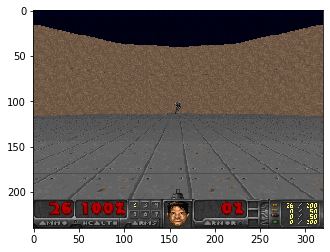

In [ ]:
def get_screen(img):
  obs_h, obs_w, _ = img.shape
  img = img[0:int(obs_h*0.89), :, :]
  img = img.transpose((2, 0, 1))
  screen = np.ascontiguousarray(img, dtype=np.float32) / 255
  obs = torch.from_numpy(screen)
  return obs.unsqueeze(0)

game.init()
game.new_episode()
state = game.get_state()
img = state.screen_buffer
print(get_screen(img).shape)
print_screen(img)
game.close()

In [ ]:
def transform_action(action):
  shoot = [0, 0, 1]
  left = [1, 0, 0]
  right = [0, 1, 0]
  if action == 0:
    return left
  elif action == 1:
    return right
  elif action == 2:
    return shoot

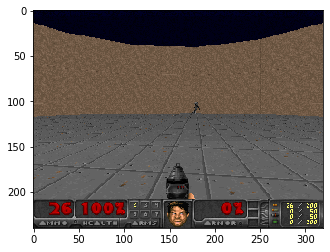

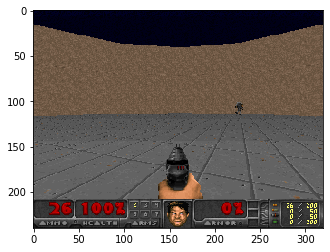

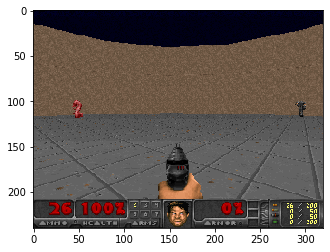

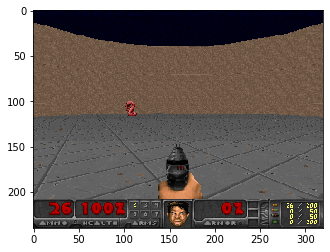

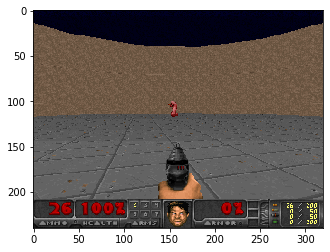

...

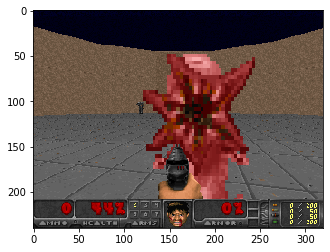

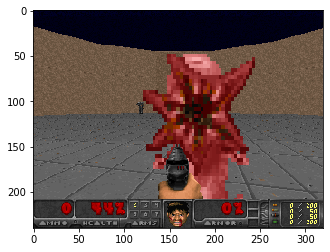

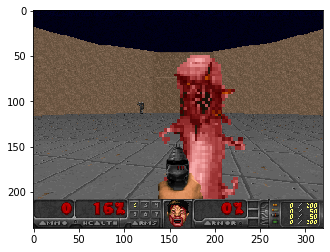

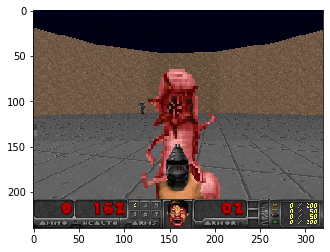

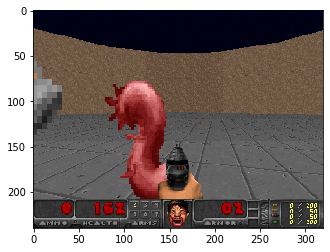

Result: 19.0


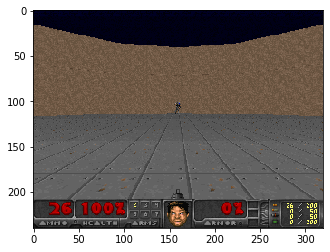

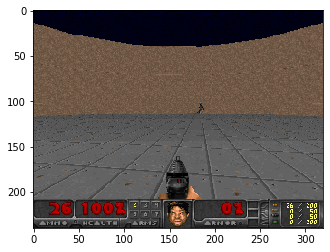

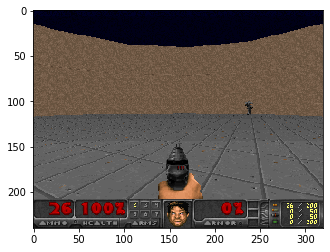

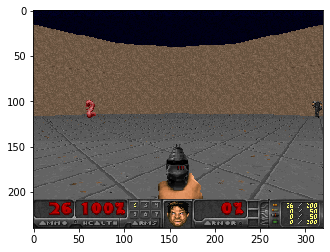

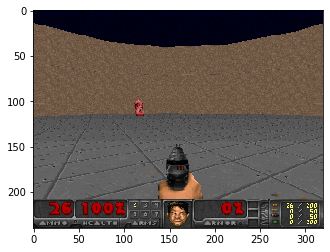

...

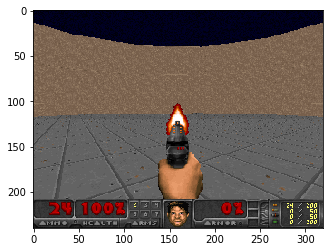

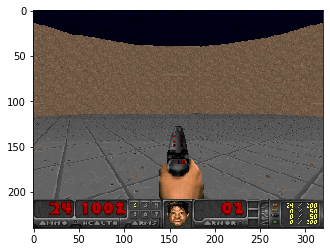

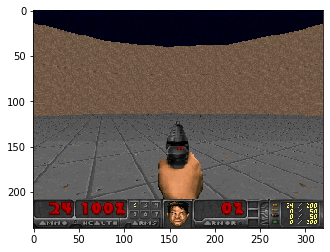

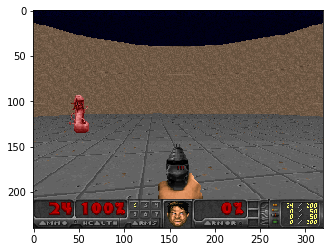

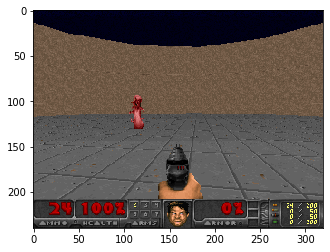

SignalException: ignored

In [ ]:
net = load_network()
net.eval()
episodes = 10
game.init()
t_render = 0
time_episode = 0
episodes_t = []
for i in range(episodes):
    game.new_episode()
    while not game.is_episode_finished():
        time_episode +=1
        state = game.get_state()
        img = state.screen_buffer
        misc = state.game_variables
        output = net(get_screen(img))
        _, predict = torch.max(output.data, 1)
        action = predict.item()
        # print("action:", action)
        reward = game.make_action(transform_action(action))
        #print("\treward:", reward)
        time.sleep(0.02)
        t_render +=1
        if t_render == 5:
          print_screen(img)
          #print(misc)
          #print(reward)
          t_render = 0
          # time.sleep(0.2)
    print("Result:", game.get_total_reward())
    # time.sleep(0.5)
    episodes_t.append(time_episode)
    time_episode = 0
print("Duracion de un episodio", episodes_t)
mean = np.mean(episodes_t)
print("media", mean)
game.close()